In [1]:
import os
import numpy as np
import pandas as pd
import zipfile
import untangle
import requests
import collections
import time
import keras
from typing import List
from tqdm import tqdm

from urllib.request import urlretrieve
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import seaborn as sns

from cddd.inference import InferenceModel
from cddd.preprocessing import preprocess_smiles

from rdkit import Chem, DataStructs
from rdkit.Chem.rdchem import Mol
from rdkit.Chem.MolStandardize.rdMolStandardize import LargestFragmentChooser
from rdkit.Chem import PandasTools, QED, AllChem, Draw, rdFMCS
from rdkit.Chem import rdRGroupDecomposition as rdRGD
from rdkit import RDLogger
lg = RDLogger.logger()
lg.setLevel(RDLogger.CRITICAL)

from sklearn.decomposition import PCA
import umap

Using TensorFlow backend.


In [10]:
inference_model = InferenceModel()

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.







Instructions for updating:
This class is equivalent as tf.keras.layers.GRUCell, and will be replaced by that in Tensorflow 2.0.
Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.
Instructions for updating:
Please use `keras.layers.RNN(cell)`, which is equivalent to this API
Instructions for updating:
Please use `layer.add_weight` method instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument in

In [2]:
filename = "AZ project/full database.xml"
with open(filename) as xml_file:  
    tree = ET.parse(xml_file)
root = tree.getroot()

In [3]:
ns = '{http://www.drugbank.ca}'
inchikey_template = "{ns}calculated-properties/{ns}property[{ns}kind='InChIKey']/{ns}value"
inchi_template = "{ns}calculated-properties/{ns}property[{ns}kind='InChI']/{ns}value"
SMILES_template = "{ns}calculated-properties/{ns}property[{ns}kind='SMILES']/{ns}value"
logS_template = "{ns}experimental-property/{ns}property[{ns}kind='logS']/{ns}value"
logP_template = "{ns}experimental-property/{ns}property[{ns}kind='logP']/{ns}value"
Water_Solubility_template = "{ns}experimental-property/{ns}property[{ns}kind='Water Solubility']/{ns}value"
Melting_Point_template = "{ns}experimental-property/{ns}property[{ns}kind='Melting Point']/{ns}value"
Boiling_Point_template = "{ns}experimental-property/{ns}property[{ns}kind='Boiling Point']/{ns}value"
Hydrophobicity_template = "{ns}experimental-property/{ns}property[{ns}kind='Hydrophobicity']/{ns}value"
Isoelectric_Point_template = "{ns}experimental-property/{ns}property[{ns}kind='Isoelectric Point']/{ns}value"
caco2_Permeability_template = "{ns}experimental-property/{ns}property[{ns}kind='caco2 Permeability']/{ns}value"
pKa_template = "{ns}experimental-property/{ns}property[{ns}kind='pKa']/{ns}value"
Radioactivity_template = "{ns}experimental-property/{ns}property[{ns}kind='Radioactivity']/{ns}value"

    
rows = list()
for i, drug in enumerate(root):
    row = collections.OrderedDict()
    assert drug.tag == ns + 'drug'
    row['type'] = drug.get('type')
    row['drugbank_id'] = drug.findtext(ns + "drugbank-id[@primary='true']")
    row['name'] = drug.findtext(ns + "name")
    row['description'] = drug.findtext(ns + "description")
    row['pharmacodynamics'] = drug.findtext(ns + "pharmacodynamics")
    row['mechanism-of-action'] = drug.findtext(ns + "mechanism-of-action")
    row['toxicity'] = drug.findtext(ns + "toxicity")
    row['metabolism'] = drug.findtext(ns + "metabolism")
    row['absorption'] = drug.findtext(ns + "absorption")
    row['volume-of-distribution'] = drug.findtext(ns + "volume-of-distribution")
    row['half-life'] = drug.findtext(ns + "half-life")
    row['protein-binding'] = drug.findtext(ns + "protein-binding")
    row['route-of-elimination'] = drug.findtext(ns + "route-of-elimination")
    row['clearance'] = drug.findtext(ns + "clearance")

    row['groups'] = [group.text for group in
        drug.findall("{ns}groups/{ns}group".format(ns = ns))]
    row['targets'] = [target.text for target in
        drug.findall("{ns}targets/{ns}target".format(ns = ns))]
    row['enzymes'] = [enzyme.text for enzyme in
        drug.findall("{ns}enzymes/{ns}enzyme".format(ns = ns))]
    
    
    row['atc_codes'] = [code.get('code') for code in
        drug.findall("{ns}atc-codes/{ns}atc-code".format(ns = ns))]
    row['categories'] = [x.findtext(ns + 'category') for x in
        drug.findall("{ns}categories/{ns}category".format(ns = ns))]
    row['inchi'] = drug.findtext(inchi_template.format(ns = ns))
    row['inchikey'] = drug.findtext(inchikey_template.format(ns = ns))
    row['SMILES'] = drug.findtext(SMILES_template.format(ns = ns))
    row['logS'] = drug.findtext(logS_template.format(ns = ns))
    row['logP'] = drug.findtext(logP_template.format(ns = ns))
    row['Water_Solubility'] = drug.findtext(Water_Solubility_template.format(ns = ns))
    row['Melting_Point'] = drug.findtext(Melting_Point_template.format(ns = ns))
    row['Boiling_Point'] = drug.findtext(Boiling_Point_template.format(ns = ns))
    row['Hydrophobicity'] = drug.findtext(Hydrophobicity_template.format(ns = ns))
    row['Isoelectric_Point'] = drug.findtext(Isoelectric_Point_template.format(ns = ns))
    row['caco2_Permeability'] = drug.findtext(caco2_Permeability_template.format(ns = ns))
    row['pKa'] = drug.findtext(pKa_template.format(ns = ns))
    row['Radioactivity'] = drug.findtext(Radioactivity_template.format(ns = ns))
    
    
    # Add drug aliases
    aliases = {
        elem.text for elem in 
        drug.findall("{ns}international-brands/{ns}international-brand".format(ns = ns)) +
        drug.findall("{ns}synonyms/{ns}synonym[@language='English']".format(ns = ns)) +
        drug.findall("{ns}international-brands/{ns}international-brand".format(ns = ns)) +
        drug.findall("{ns}products/{ns}product/{ns}name".format(ns = ns))

    }
    aliases.add(row['name'])
    row['aliases'] = sorted(aliases)

    rows.append(row)
    
def collapse_list_values(row):
    for key, value in row.items():
        if isinstance(value, list):
            row[key] = '|'.join(value)
    return row

rows = list(map(collapse_list_values, rows))

In [4]:
df_db = pd.DataFrame.from_dict(rows)
df_db = df_db[df_db['type'] == 'small molecule']
df_db = df_db.dropna(subset = ['SMILES']).reset_index().drop(columns = 'index')

In [5]:
# DMDC not found, Vinflunine = CPT-11
drug_list = ['Docetaxel', 'Paclitaxel', 'Etoposide', 'DMDC', 'Irinotecan', 'Vinflunine']

In [6]:
df_drug = df_db[df_db['name'].isin(drug_list)].copy().reset_index().drop(columns = 'index')
df_drug = df_drug.drop(columns = ['targets', 'enzymes', 'inchi', 'inchikey', 'logS', 'logP', 'Water_Solubility', 'Melting_Point', 'Boiling_Point', 'Hydrophobicity', 'Isoelectric_Point', 'caco2_Permeability', 'pKa', 'Radioactivity'])

In [7]:
#df_drug[df_drug['categories'].str.contains('Immunosuppressive')]
df_drug

,type,drugbank_id,name,description,pharmacodynamics,mechanism-of-action,toxicity,metabolism,absorption,volume-of-distribution,half-life,protein-binding,route-of-elimination,clearance,groups,atc_codes,categories,SMILES,aliases
0,small molecule,DB00762,Irinotecan,Irinotecan is an antineoplastic enzyme inhibit...,Irinotecan is an antineoplastic enzyme inhibit...,Irinotecan inhibits the action of topoisomeras...,"Gastrointestinal complications, such as nausea...",Hepatic. The metabolic conversion of irinoteca...,The maximum plasma concentration (Cmax) when a...,The volume of distribution of terminal elimina...,The half life of irinotecan is about 6 - 12 ho...,"30%-68% protein bound, mainly to albumin.",The cumulative biliary and urinary excretion o...,"* 13.3 L/h/m^2 [Dose of 125 mg/m^2, patients ...",approved|investigational,L01CE02,Alkaloids|Antineoplastic Agents|Antineoplastic...,CCC1=C2CN3C(=CC4=C(COC(=O)[C@]4(O)CC)C3=O)C2=N...,\n |Camptosar|Irinotecan|Irinotecan Hydro...
1,small molecule,DB00773,Etoposide,A semisynthetic derivative of podophyllotoxin ...,Etoposide is an antineoplastic agent and an ep...,"Etoposide inhibits DNA topoisomerase II, there...","Side effects include alopecia, constipation, d...",Primarily hepatic (through O-demethylation via...,"Absorbed well, time to peak plasma concentrati...",The disposition of etoposide is a biphasic pro...,4-11 hours,97% protein bound.,Etoposide is cleared by both renal and nonrena...,* Total body clearance = 33 - 48 mL/min [IV ad...,approved,L01CB01,"Antineoplastic Agents|Antineoplastic Agents, P...",[H][C@]12COC(=O)[C@]1([H])[C@H](C1=CC(OC)=C(O)...,\n |Dom-etoposide|Eposin|Etopophos|Etopos...
2,small molecule,DB01229,Paclitaxel,Paclitaxel is a chemotherapeutic agent markete...,Paclitaxel is a taxoid antineoplastic agent in...,Paclitaxel interferes with the normal function...,Rat (ipr) LD<sub>50</sub>=32530 &micro;g/kg. S...,Hepatic. In vitro studies with human liver mic...,When a 24 hour infusion of 135 mg/m^2 is given...,* 227 to 688 L/m^2 [apparent volume of distrib...,When a 24 hour infusion of 135 mg/m^2 is given...,89%-98% bound to plasma protein. The presence ...,In 5 patients administered a 225 or 250 mg/m2 ...,"* 21.7 L/h/m2 [Dose 135 mg/m2, infusion durati...",approved|vet_approved,L01CD01,Agents Causing Muscle Toxicity|Albumins|Amino ...,[H][C@]12[C@H](OC(=O)C3=CC=CC=C3)[C@]3(O)C[C@H...,\n |Abraxane|Abraxane for Injectable Susp...
3,small molecule,DB01248,Docetaxel,Docetaxel is a clinically well established ant...,Docetaxel is a taxoid antineoplastic agent. It...,Docetaxel interferes with the normal function ...,Oral LD<sub>50</sub> in rat is >2000 mg/kg. An...,Hepatic. In vitro drug interaction studies rev...,The pharmacokinetic profile is consistent with...,The initial rapid decline represents distribut...,Dose-dependent. Doses of 70 mg per square mete...,"In vitro studies show that 94% protein bound, ...",Docetaxel was eliminated in both the urine and...,"* 21 L/h/m2 [Total body clearance, cancer pati...",approved|investigational,L01CD02,Agents Causing Muscle Toxicity|Antimitotic Age...,[H][C@@]1(C[C@@]2(O)[C@@H](OC(=O)C3=CC=CC=C3)[...,Act Docetaxel 40 mg/ml|Docefrez|Docetaxel|Doce...
4,small molecule,DB11641,Vinflunine,Vinflunine is a third-generation member of the...,The antitumour effects of vinflunine are depen...,Microtubules are a major component of the cyto...,Overdose of vinflunine is associated with bone...,The metabolites of influnine are mostly cytoch...,Vinflunine displays a linear pharmacokinetic p...,"The terminal volume of distribution is large, ...",The mean terminal half-life is approximately 4...,Vinflunine is 67.2 ± 1.1% bound to human plasm...,Fecal excretion accounts for 2/3 of the total ...,The total blood clearance was 40 L/h according...,approved|investigational,L01CA05,Alkaloids|Antineoplastic Agents|Antineoplastic...,CC[C@@]12C=CCN3CC[C@@]4([C@H]13)[C@@H](N(C)C1=...,Javlor|Vinflunine


In [27]:
# preprocess_smiles function is not able to preprocess paclitaxel, docetaxel and vinflunine
df_drug['smiles_preprocessed'] = df_drug['SMILES'].apply(preprocess_smiles)
df_drug['smiles_preprocessed']

643     CCc1c2c(nc3ccc(OC(=O)N4CCC(N5CCCCC5)CC4)cc13)-...
654     COc1cc(C2c3cc4c(cc3C(OC3OC5COC(C)OC5C(O)C3O)C3...
1096                                                  NaN
1115                                                  NaN
7952                                                  NaN
Name: smiles_preprocessed, dtype: object

In [8]:
df_drug['mols'] = df_drug['SMILES'].apply(lambda x: Chem.MolFromSmiles(x))

INFO:tensorflow:Restoring parameters from /Users/ty/opt/anaconda3/lib/python3.7/site-packages/cddd/data/default_model/model.ckpt
INFO:tensorflow:Restoring parameters from /Users/ty/opt/anaconda3/lib/python3.7/site-packages/cddd/data/default_model/model.ckpt


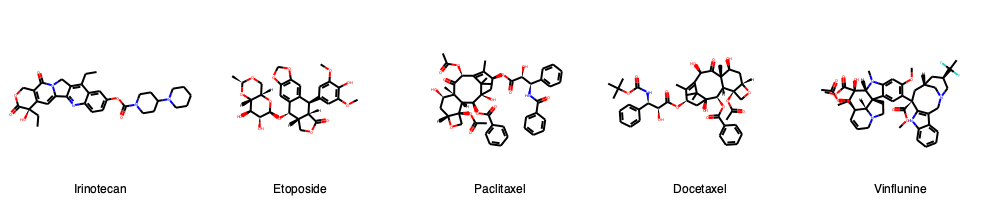

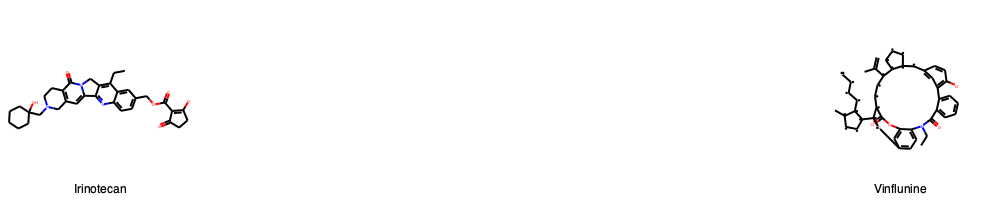

In [31]:
# InferenceModel is not able to autoencode etopside, paclitaxel and docetaxel

keras.backend.clear_session()
df_drug['mols'] = df_drug['SMILES'].apply(lambda x: Chem.MolFromSmiles(x))
X_latent = inference_model.seq_to_emb(df_drug['SMILES'])
reconstructed_smiles = inference_model.emb_to_seq(X_latent)
df_drug['recon_SMILES'] = reconstructed_smiles
df_drug['recon_mols'] = df_drug['recon_SMILES'].apply(lambda x: Chem.MolFromSmiles(x))

display(Draw.MolsToGridImage(mols = df_drug['mols'], legends = df_drug['name'].to_list(), molsPerRow = 5),
Draw.MolsToGridImage(mols = df_drug['recon_mols'], legends = df_drug['name'].to_list(), molsPerRow = 5))

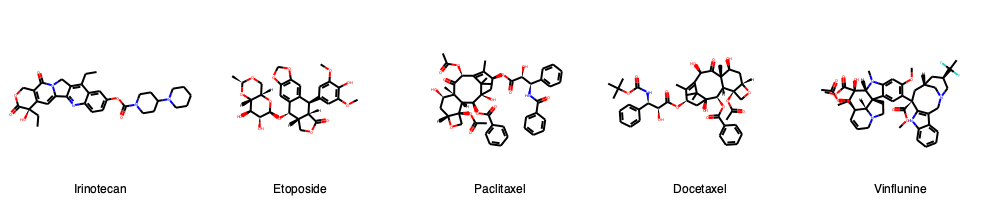

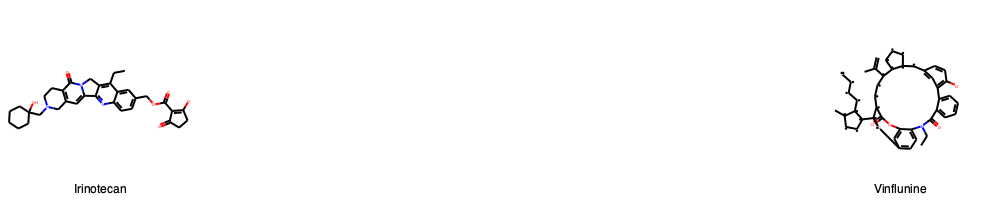

In [32]:
display(Draw.MolsToGridImage(mols = df_drug['mols'], legends = df_drug['name'].to_list(), molsPerRow = 5),
Draw.MolsToGridImage(mols = df_drug['recon_mols'], legends = df_drug['name'].to_list(), molsPerRow = 5))

In [8]:
def get_largest_fragment_from_smiles(s: str):
    mol = Chem.MolFromSmiles(s)
    if mol:
        clean_mol = LargestFragmentChooser().choose(mol)
        return Chem.MolToSmiles(clean_mol)
    return None


def compute_ecfp_descriptors(smiles_list: List[str]):
    """ Computes ecfp descriptors """
    
    keep_idx = []
    descriptors = []
    for i, smiles in enumerate(tqdm(smiles_list)):
        ecfp = _compute_single_ecfp_descriptor(smiles)
        if ecfp is not None:
            keep_idx.append(i)
            descriptors.append(ecfp)

    return np.vstack(descriptors), keep_idx

def _compute_single_ecfp_descriptor(smiles: str):
    try:
        mol = Chem.MolFromSmiles(smiles)
    except Exception as E:
        return None

    if mol:
        fp = Chem.AllChem.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=2048)
        return np.array(fp)
    
    return None

In [9]:
fp_drug, keep_idx_drug = compute_ecfp_descriptors(df_drug['SMILES'])

100%|██████████| 5/5 [00:00<00:00, 106.38it/s]


In [10]:
df_i = df_db[df_db['categories'].str.contains('Immunosuppressive') &
     ~df_db['name'].isin(drug_list)].copy().reset_index().drop(columns = 'index')
fp_i, keep_idx_i = compute_ecfp_descriptors(df_i['SMILES'])


df_ni = df_db[~df_db['categories'].str.contains('Immunosuppressive') &
     ~df_db['name'].isin(drug_list)].copy().reset_index().drop(columns = 'index')
fp_ni, keep_idx_ni = compute_ecfp_descriptors(df_ni['SMILES'])

100%|██████████| 11359/11359 [01:30<00:00, 125.31it/s]


In [11]:
print(fp_drug.shape, fp_i.shape, fp_ni.shape)

(5, 2048) (216, 2048) (11345, 2048)


In [12]:
name_drug = df_drug['name'][keep_idx_drug].to_list()
name_i = df_i['name'][keep_idx_i].to_list()
name_ni = df_ni['name'][keep_idx_ni].to_list()

In [13]:
label_drug = np.array([2,2,2,2,2])
label_i = np.ones(fp_i.shape[0])
label_ni = np.zeros(fp_ni.shape[0])

In [14]:
fp = np.concatenate([fp_drug, fp_i, fp_ni])
label = np.concatenate([label_drug, label_i, label_ni])
name = np.concatenate([name_drug, name_i, name_ni])
print(fp.shape, label.shape, name.shape)

(11566, 2048) (11566,) (11566,)


In [15]:
## Labels

# 0 -> Non-myelosuppressive drugs
# 1 -> myelosuppressive drugs
# 2 -> drugs in Friberg,2002 (3 myelosuppressive, 1 non-myelosuppressive)

# Myelosuppresive -> docetaxel, paclitaxel, etoposide
# Non-myelosuppressive -> vinflunine

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 5.25 µs


<AxesSubplot:xlabel='X', ylabel='Y'>

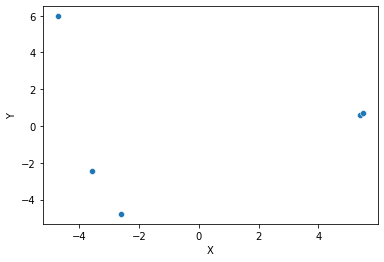

In [12]:
# PCA

%time
pca = PCA(n_components = 2)
pca_embedded = pca.fit_transform(fp_drug)
df_pca = pd.DataFrame(pca_embedded, columns = ['X', 'Y'])
df_pca['label'] = label_drug
df_pca['name'] = name_drug

#plt.figure(figsize = (20,20))
sns.scatterplot(data = df_pca, x = 'X', y = 'Y'#, hue = 'label',
               #palette = {2:'red', 1:'blue', 0:'grey'}
               )

In [13]:
pca.explained_variance_ratio_

array([0.4264223 , 0.27694463])

In [14]:
df_pca

,X,Y,label,name
0,-3.576600,-2.458157,2,Irinotecan
1,-2.586386,-4.782403,2,Etoposide
2,5.387938,0.585361,2,Paclitaxel
3,5.477906,0.685959,2,Docetaxel
4,-4.702859,5.969240,2,Vinflunine


In [15]:
friberg_dict = {'Docetaxel':8.58, 'Paclitaxel':2.21, 'Etoposide':0.126, 'Irinotecan':1.29, 'Vinflunine':0.00349}
df_pca['alpha'] = df_pca['name'].map(friberg_dict)
df_pca

,X,Y,label,name,alpha
0,-3.576600,-2.458157,2,Irinotecan,1.29000
1,-2.586386,-4.782403,2,Etoposide,0.12600
2,5.387938,0.585361,2,Paclitaxel,2.21000
3,5.477906,0.685959,2,Docetaxel,8.58000
4,-4.702859,5.969240,2,Vinflunine,0.00349


In [16]:
df_pca['alpha'] = np.log(df_pca.alpha)
df_pca

,X,Y,label,name,alpha
0,-3.576600,-2.458157,2,Irinotecan,0.254642
1,-2.586386,-4.782403,2,Etoposide,-2.071473
2,5.387938,0.585361,2,Paclitaxel,0.792993
3,5.477906,0.685959,2,Docetaxel,2.149434
4,-4.702859,5.969240,2,Vinflunine,-5.657854


In [17]:
from scipy import stats

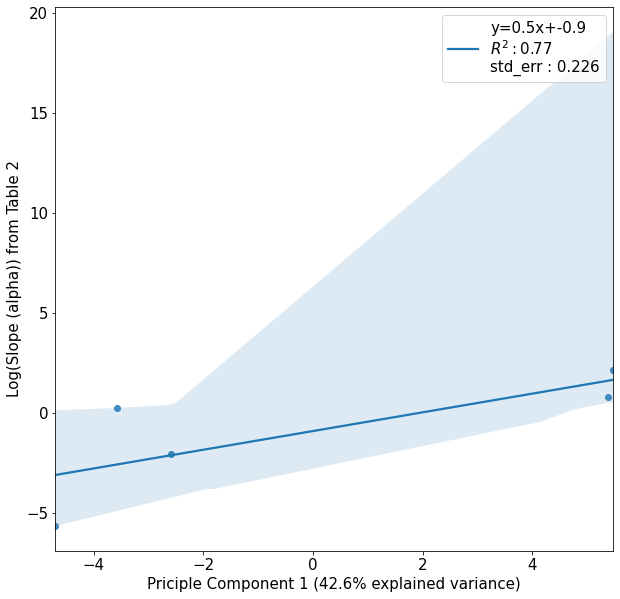

In [20]:
from scipy import stats

plt.figure(figsize = (10,10))
plt.rcParams['font.size'] = 15
slope, intercept, r_value, p_value, std_err = \
stats.linregress(df_pca['X'], df_pca['alpha'])
sns.regplot(x = 'X', y = 'alpha', data = df_pca,
                   line_kws={'label':"y={0:.1f}x+{1:.1f}\n"
                             r"$R^2:{2:.2f}$""\nstd_err : {3:.3f}".format(slope,intercept,r_value,std_err)})
plt.xlabel('Priciple Component 1 (42.6% explained variance)')
plt.ylabel('Log(Slope (alpha)) from Table 2')
plt.legend()
plt.show()

# UMAP on myelosuppressive vs non-myelosuppresive

CPU times: user 8min 11s, sys: 5.72 s, total: 8min 17s
Wall time: 47.7 s


<AxesSubplot:xlabel='X', ylabel='Y'>

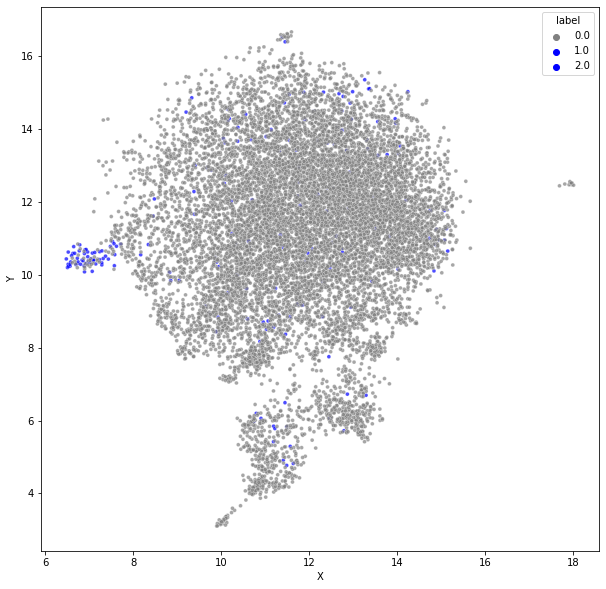

In [27]:
# UMAP

%time umap_embedded = umap.UMAP(n_components = 2, n_neighbors = 300, min_dist = 0.5).fit_transform(fp)
df_umap = pd.DataFrame(umap_embedded, columns = ['X', 'Y'])
df_umap['label'] = label
df_umap['name'] = name

plt.figure(figsize = (10,10))
sns.scatterplot(data = df_umap, x = 'X', y = 'Y', hue = 'label',
               palette = {2:'blue', 1:'blue', 0:'grey'}, alpha = 0.7,
               s = 15
               )

### UMAP parameters adjustment

In [21]:
def UMAP_plot(chem_input, labels, neighbor_range, outfile = None, metric = 'euclidean', min_dist = 0.1):
    param_len = len(neighbor_range)
    fig, axes = plt.subplots(figsize = (20, param_len*5), nrows = int(param_len/2), ncols = 2)
    
    
    for i, param in enumerate(neighbor_range):
        ax = axes.flatten()[i]
        ax.set_title('N_neighbors: %d / Min_distance: %.1f' % (param, min_dist))
        UMAP_embedded = umap.UMAP(
            n_components=2, n_neighbors = param, metric = metric, min_dist = min_dist
        ).fit_transform(chem_input)
        
        sns.scatterplot(x = UMAP_embedded[:,0], y = UMAP_embedded[:,1], ax = ax,
                        hue = label,  alpha = 0.7,
                        palette = {2:'blue', 1:'blue', 0:'grey'},
                        s = 15
                       )
    if outfile:
        plt.savefig(outfile)
    return plt.show()

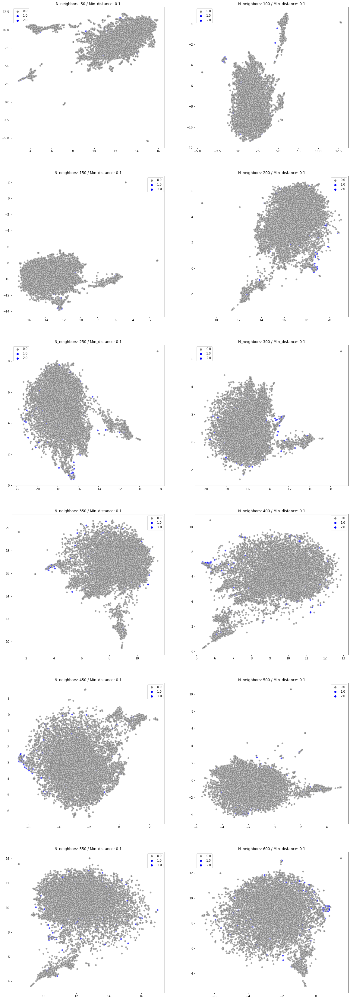

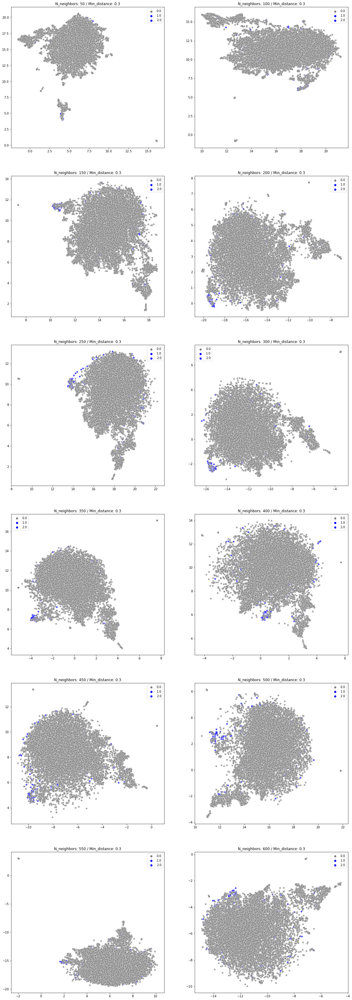

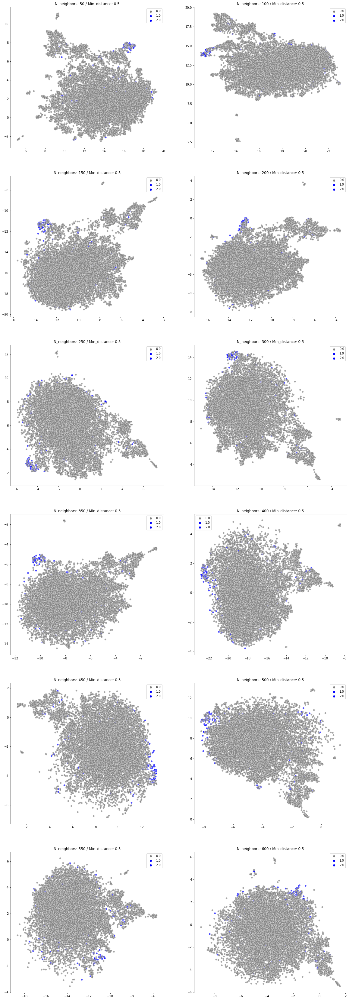

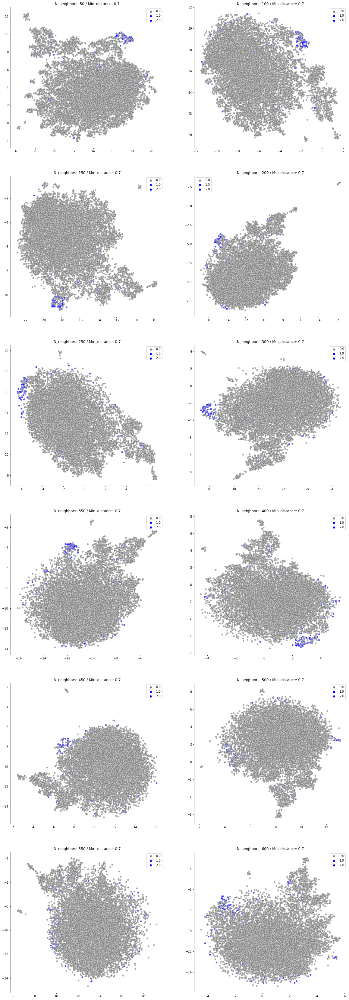

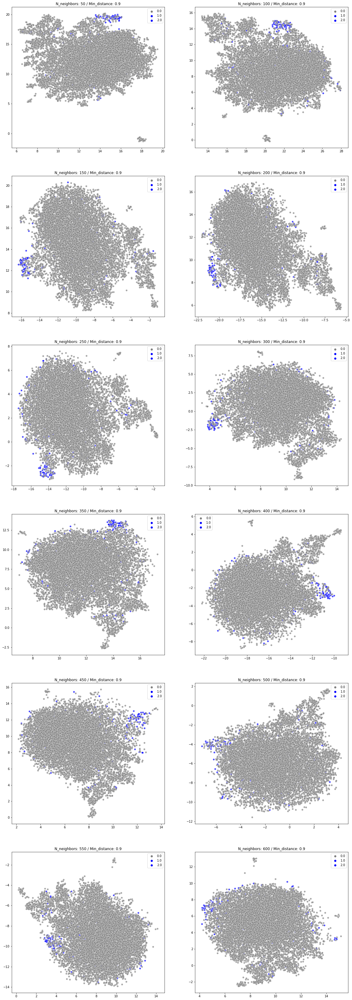

In [22]:
min_params = [0.1, 0.3, 0.5, 0.7, 0.9]

for i in min_params:
    UMAP_plot(fp, label, neighbor_range = range(50,601,50), min_dist = i)